# Laboratory #5_1 : Object Detection with YOLO

At the end of this laboratory, you would get familiarized with

*   Object Detection
*   YOLO for Object Detection using Keras and TensorFlow

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Add sufficient comments and explanations wherever necessary.
*   **Once you have the code completed, use GPU to train model faster.**

---

**Authors**
- Joaquim Marset Alsina
- Jesús Molina Rodríguez de Vera

# YOLOv3 for Object Detection

*   There are several open source implementations of each version of YOLO.
*   For this exercise, we would not be implementing the YOLO from scratch as it is a challenging model and requires many customized elements.
*   We would use an open source implementation of YOLOv3 available from Python Lessons github repo, implemented with TensorFlow 2.x.
*   More details about YOLO can be found [here](https://pjreddie.com/darknet/yolo/). Refer the site and also the [paper](https://pjreddie.com/media/files/papers/YOLOv3.pdf) for better understanding.

## Clone the repo in the notebook

In [1]:
! git clone --recursive https://github.com/pythonlessons/TensorFlow-2.x-YOLOv3.git

Cloning into 'TensorFlow-2.x-YOLOv3'...


In [ ]:
# navigate to the cloned repository

%cd TensorFlow-2.x-YOLOv3/

In [3]:
# installing additional requirements using pip

! pip install -r requirements.txt

# Please note that some libraries would return error. 
# If they are not important dependecies, you can skip those errors.
# Pip installation might require restarting the notebook. 
# Follow the installation output

     |████████████████████████████████| 320.4 MB 25 kB/s 
     |████████████████████████████████| 320.4 MB 27 kB/s 
     |████████████████████████████████| 59 kB 5.4 MB/s 
     |████████████████████████████████| 3.8 MB 43.3 MB/s 
     |████████████████████████████████| 76 kB 4.7 MB/s 
     |████████████████████████████████| 459 kB 36.6 MB/s 
     |████████████████████████████████| 20.1 MB 1.3 MB/s 
     |████████████████████████████████| 2.9 MB 35.4 MB/s 
     |████████████████████████████████| 79 kB 6.6 MB/s 
     |████████████████████████████████| 547 kB 39.5 MB/s 
     |████████████████████████████████| 8.5 MB 34.0 MB/s 
     |████████████████████████████████| 127 kB 48.8 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=2779973cf5baf0ef6c01f2e7e51ac1318339f8a6efc207bfbfb2f2c153e53470
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    

## Loading pre-trained weights

*   Load the weights using any one of the methods

In [4]:
#  download the weights to the filesystem 
# (Remember that this would not be persistent)
# If you need the weights to be persistent, upload the weights to your drive
# and load from the drive

! wget -P model_data https://pjreddie.com/media/files/yolov3.weights

--2021-12-20 20:38:49--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘model_data/yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  55.5MB/s    in 4.4s    

2021-12-20 20:38:53 (53.4 MB/s) - ‘model_data/yolov3.weights’ saved [248007048/248007048]



## Detecting objects in images

*   Run sample predictions using the pre-trained weights

In [5]:
from yolov3.utils import detect_image, Load_Yolo_model
from yolov3.configs import *

image_path = "./IMAGES/kite.jpg"
output_path = "./kite_pred.jpg"

yolo = Load_Yolo_model()

kite_predictions = detect_image(
    yolo, 
    image_path, 
    output_path, 
    input_size=YOLO_INPUT_SIZE, 
    show=False, 
    rectangle_colors=(255,0,0))

# You will find the predictions file saved in the output path
# all objects present in MS-COCO classes would be detected in the saved file

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights


## Understanding Image Detection function

*   In this exercise, you have to write your own function for object detection (Each step would lead to replicating the existing function)

*   Load the input image and visualize the image using matplotlib
*   Please note that image read is different in matplotlib, skimage and opencv. You will need to do appropriate conversion if using opencv

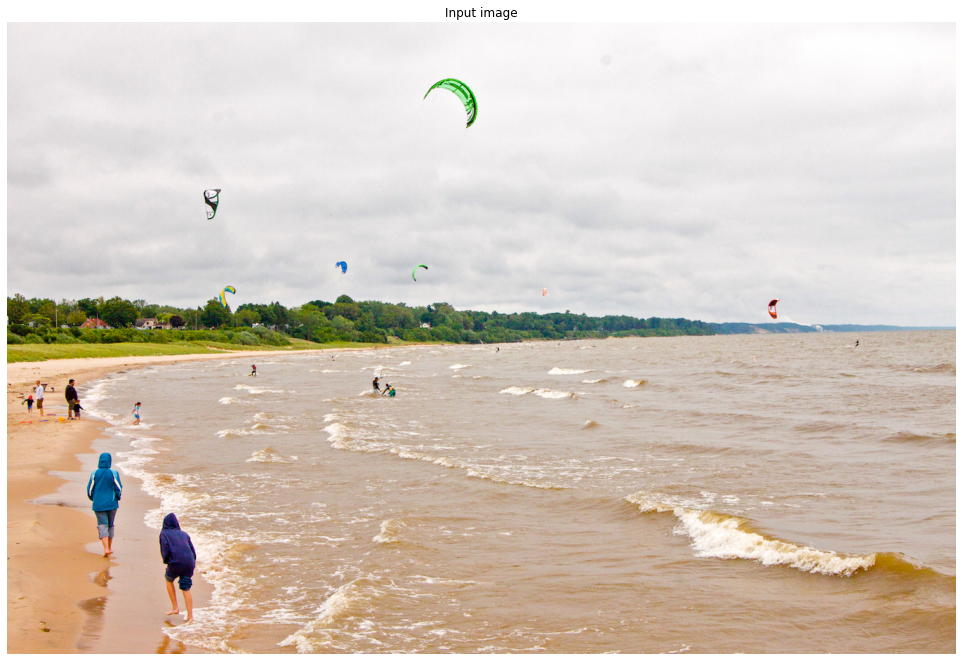

In [6]:
# solution
from skimage.io import imread
from matplotlib import pyplot as plt

image = imread("IMAGES/kite.jpg")
plt.figure(figsize=(17, 17))
plt.imshow(image)
plt.title("Input image")
plt.axis("off");

*   Load the configurations

In [7]:
# open the configs.py file to understand the different configuration parameters

from yolov3.configs import *

*   Load the pre-trained weights using the Load_Yolo_model fuction available in yolov3.utils

In [8]:
from yolov3.utils import Load_Yolo_model

yolo = Load_Yolo_model()

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights


*   Preprocess the image according to the network to be used

In [9]:
import numpy as np
from yolov3.utils import image_preprocess

image_data = image_preprocess(np.copy(image), [YOLO_INPUT_SIZE, YOLO_INPUT_SIZE])
image_data = image_data[np.newaxis, ...].astype(np.float32)

print('Original image:', image.shape)
print('Processed image:', image_data.shape)

Original image: (900, 1352, 3)
Processed image: (1, 416, 416, 3)


### Prediction boxes

*   Predict bounding boxes using the predict method 

In [10]:
pred_bbox = yolo.predict(image_data)

*   Get the prediction statistics

In [11]:
print('Length of the prediction boxes =', len(pred_bbox))
print('Shape of each prediction box ')

for i in range(len(pred_bbox)):
    print('Shape of prediction box', i, 'is', pred_bbox[i].shape)

Length of the prediction boxes = 3
Shape of each prediction box 
Shape of prediction box 0 is (1, 52, 52, 3, 85)
Shape of prediction box 1 is (1, 26, 26, 3, 85)
Shape of prediction box 2 is (1, 13, 13, 3, 85)


*   Why is the length of prediction boxes 3?

**Solution**

Because YOLOv3 predicts at 3 different scales, so each one of those prediction boxes corresponds to the boxes in one of those scales.

More precisely, YOLOv3 has 3 output layers corresponding to different output volumes working at different grid sizes. That is, it considers 3 grids with a different number of cells: 52x52, 26x26, and 13x13. Working at different grid sizes means different grid cells sizes, which in turn can result in better results when trying to objects of different sizes. For instance, we may have multiple objects whose centre may fall in the same cell of the smallest gird, and then YOLO would fail when trying to detect all (maybe it can handle with a few, but not detecting all of them). However, it is possible that with the biggest grid (i.e. with smallest cell size), each object centre might fall in different cells, and YOLO can successfully detect them all.

The "grid size" of each output layer is determined by the weight and height of its output.

*   What does the shape of each prediction box represent?
*   Which layer corresponds to each prediction box output?

**Solution**

The shape of each box is (batch_size, number_horizontal_cells, number_vertical_cells, number_anchor_boxes, predictions).

The first dimension is 1 in our case for the three cases because we are only getting the output for one image.

The second and third dimensions correspond to the size of the grid in which the image is divided at each scale to perform the detection.

The fourth dimension represents the anchor box to which a bounding box refers. In this case, in YOLOv3, there are 3 bounding boxes per scale. More information about anchor boxes is given in subsequent exercises.

The elements of the last dimension (a total of 85) are the predictions for every bounding box. This point is explained in the next exercise.

Layers 82, 97, and 106, are the ones generating each grid.

*   What does 85 represent in the last dimension of the prediction box shape?

**Solution**

85 is the number of components that are needed to define a bounding box. Where does this number come from?

$$
85=4+1+80
$$ 

The first 4 elements are:
- $t_x$: horizontal offset of the bounding box.
- $t_y$: vertical offset of the bounding box.
- $t_w$: width of the bounding box.
- $t_h$: height of the bounding box.

Please note that, **according to the paper**, the outputs of the network for the above mentioned variables has to be processed in order to transform them to a more convenient range of values. In particular the following transformations are applied:
- $b_x=\sigma(t_x)+c_x$
- $b_y=\sigma(t_y)+c_y$
- $b_w = p_w e^{t_w}$
- $b_h = p_h e^{t_h}$

Where $\sigma$ is the sigmoid function, $c_x,c_y$ are the top-left coordinates of the cell, and $p_w,p_h$ are the dimensions of the anchor. In other words, the positions are transformed to the range 0-1 (to work with relative values) and the dimensions ($b_w$ and $b_h$) are obtained as a product of the dimension of the anchors (learning using reference anchors makes the process easier according to the results reported by the authors).

The 5th element is known as the *objectness score* and it represents the confidence score of whether the given block contains the centre of any object of the original image. This score is independent of the class of the object.

The final 80 elements are the probabilities of the detected object belonging to a particular class. Given that the COCO dataset (used with YOLO) contains 80 classes, this gives us 80 probabilities.

*   What is the aim in having three prediction boxes array?
*   Why is it helpful?

**Solution**

We already have made some comments on this in previous exercises.

Predicting bounding boxes using outputs of the network at different scales enables the network to properly detect objects of different sizes. One of the main problems with the original YOLO architecture was that it failed to detect small objects in the images. Thanks to this multi-scale prediction, YOLOv3 overcomes this issue.

The three outputs of the network are 8, 16 and 32 times smaller than the original image of $416\times416$. Obviously, the smaller the representation, the more difficult it is to find small objects in it, while it is easier to detect bigger objects.

*   Reshape the prediction boxes

In [12]:
import tensorflow as tf

pred_bbox = [tf.reshape(x, (-1, tf.shape(x)[-1])) for x in pred_bbox]
pred_bbox = tf.concat(pred_bbox, axis=0)

print(pred_bbox.shape)

(10647, 85)


*   What do you think happens in the previous cell (reshaping the prediction boxes)? Explain the code as per your understanding.
*   Why do you think this step is needed?

**Solution**

The objective of the previous cell is to create an array with all the bounding boxes (for different scales and anchors). Indeed, it is easy to check that

$$
10647 = 3\times( 52^2 + 26^2 + 13^2)
$$

which is the total number of bounding boxes considered. Given that all the bounding boxes are defined by 85 numbers, we can mix everything together.

This code is required because it gives us a uniform representation of all the bounding boxes, allowing us to have all of them in a single array. We perform this step prior to doing non-max suppression. This way we can facilitate the process of filtering non-maximal bounding boxes by flattening the original 4-dimensional vector to a 2D vector.

*   What are anchor boxes? What is the significance of anchor boxes in YOLO?

**Solution**

Instead of directly predicting the size of the bounding boxes, which leads unstable gradient during training, YOLOv3 predicts the size of the bounding boxes in terms of some predefined default boxes called anchor boxes.

Therefore, each bounding box predicted by YOLOv3 is assigned to a cell and an anchor box. So for every detected object,  we will still assign it to the cell containing the object's midpoint, but we will decide to which anchor box. For example, we may have 2 anchor boxes, having both rectangular shapes, but one higher than wider, and the other wider than higher. If a car and a pedestrian both fall in the same cell, the car will be assigned to the wider one and the pedestrian to the higher one. The way we will check to which anchor box will be using the Intersection over Union (IoU).

As we have previously mentioned, in YOLOv3 there are a total of 9 anchor boxes: three per scale. These anchor boxes are obtained from the dataset by running some clustering algorithm like K-means, which enables using representative boxes for every dataset. At inference time, a bounding box is predicted for every cell, scale and anchor box.

Of course, later we will still apply the non-max suppression, given that we may have multiple bounding boxes detecting the same object, as each might consider being the one containing the midpoint of the object.

*   Post process the prediction bounding boxes

In [13]:
from yolov3.utils import postprocess_boxes

score_threshold = 0.3

bboxes = postprocess_boxes(pred_bbox, image, YOLO_INPUT_SIZE, score_threshold)

In [14]:
len(bboxes)

21

*   What is score threshold? What is the role of score threshold?

**Solution**

The score threshold is used as a cutoff to filter the bounding boxes. For every bounding box, we can compute its score as the product of its objectness score and the probability of the most likely class. In other words, for the i-th bounding box we have:

$$
score_i = objectness_i * pclass_i \quad \text{where} \quad pclass_i = \max_k P_i(c_k).
$$

This is a measure of how confident the network is in a given bounding box containing an object of the most likely object for that bounding box. A value close to 1 indicates high confidence of the model in its prediction, while a value of 0 indicates that the model is not very confident in having found an object for the given cell and anchor box. By discarding the boxes whose score is below the given threshold, we are ruling out the bounding box for which the network is not sure "enough".

Therefore, we are filtering those predicted bounding boxes whose confidence of having found an object of a particular class is lower or equal to 0.3. 0.3 is a value closer to 0 than what is to 1, so we are discarding those that we assume will not contain any object.

*   What happens when the score_threshold is low? What happens when it is high?

**Solution**

The lower the threshold, the easier it would be for the boxes to pass the filter. Therefore, the final number of boxes is likely to increase, as well as the number of false positives. That is especially possible if they even pass the non-max suppression if the IoU is not high enough.

The higher the threshold, the more bounding boxes would be discarded. Therefore, the number of final boxes will be reduced, as well as the number of false negatives.

### Non-maximum Supression

*   What is non-maximum supression? Why is it needed?
*   What happens in this step?

**Solution**

It is possible to obtain several bounding boxes for the same object (different anchors, scales, and even different cells can refer to the same object). Therefore, it is necessary to have a mechanism to disambiguate these cases and pick only the "best" bounding box.

This mechanism is the non-maximum suppression, whose role is detecting highly overlapping boxes and selecting the one with the highest $score_i$, discarding the other ones.

It works iteratively until no more bounding boxes can be removed, hopefully leaving only one per object. In particular:
* We found the bounding box with maximal $score_i$.
* We compute the IoU of that box with all the other boxes.
* If for a particular bounding box the IoU is greater than a certain threshold, that bounding box is removed. A big overlap will mean that those two boxes should try to locate the same object, whereas a small overlap should refer to different objects.

*   Apply NMS on the bounding boxes.

In [15]:
from yolov3.utils import nms

iou_threshold = 0.45

bboxes = nms(bboxes, iou_threshold, method='nms')

*   What is the role of IoU Threshold? What happens when a IoU higher threshold is used?

**Solution**

In the previous exercise, we mentioned that the algorithm finds "highly overlapping boxes". However, it is not clear what "highly overlapping" means. 

We can measure the level of overlapping using the intersection-over-union (IoU) between two boxes, whose value is 1 if they are the same and 0 if they do not overlap each other at all. Once we have computed this value, the IoU Threshold establishes the cutoff above which 2 boxes are considered to be "highly overlapping".

As with all the thresholds of this kind, there is a trade-off:
- If the threshold is too low, we might end up discarding bounding boxes that do not refer to the same objects. Thus, we could lose some objects in the final prediction.
- If the threshold is too high, we might include duplicates in the final prediction.

In [16]:
#  draw the predicted bounding boxes on the image

from yolov3.utils import draw_bbox

pred_image = draw_bbox(image, bboxes, CLASSES=YOLO_COCO_CLASSES, rectangle_colors='')

### Predicting output

*   Visualize the pred_image using matplotlib

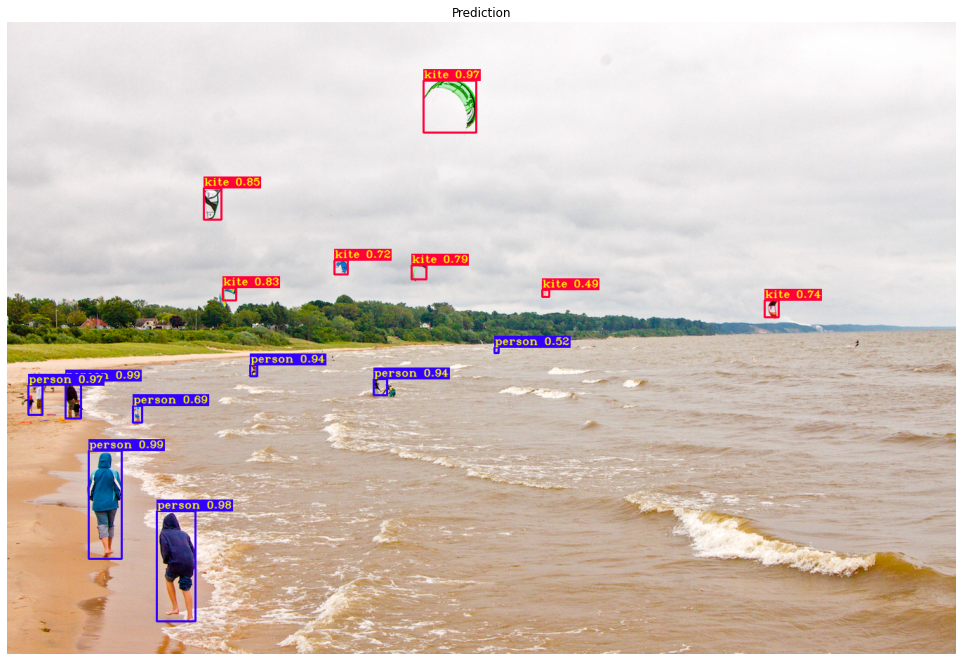

In [17]:
# solution

plt.figure(figsize=(17, 17))
plt.imshow(pred_image)
plt.title("Prediction")
plt.axis("off");

# YOLO training

*   In this exercise, the task is to train mnist dataset using YOLOv3-Tiny model
*   Load the YOLOv3-Tiny weights using any one of the methods
*   For this experiment, we would use MNIST as the training data
*   Please note that all the necessary code is already available in the repo

In [18]:
# download the weights to the filesystem 
# (Remember that this would not be persistent)

! wget -P model_data https://pjreddie.com/media/files/yolov3-tiny.weights

--2021-12-20 20:39:31--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘model_data/yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M  43.8MB/s    in 0.8s    

2021-12-20 20:39:32 (43.8 MB/s) - ‘model_data/yolov3-tiny.weights’ saved [35434956/35434956]



### Prepare data

*   The model takes a long time to train even with GPU. In order to fasten the training process, let us change the number of training and testing images in **mnist/make_data.py** file.
```
images_num_train = 500  # line number 20 in make_data.py
images_num_test = 50  # line number 21 in make_data.py
```
*   PS: 
    *   The dataset is already available in the repository.
    *   The file can be opened by double clicking on the filename from the Files menu.


*   Prepare the dataset for training

In [2]:
! python mnist/make_data.py

Extracting all train files now...
Done!
Extracting all test files now...
Done!
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000001.jpg 220,116,262,158,4 105,156,147,198,7 325,277,367,319,2 260,170,302,212,2 184,101,212,129,8 327,61,411,145,3
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000002.jpg 310,35,324,49,3 274,160,316,202,8 264,307,306,349,9 329,33,385,89,3 147,330,231,414,2 138,159,250,271,3 24,265,108,349,2
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000003.jpg 200,65,214,79,8 226,182,282,238,9 24,73,52,101,3 120,195,162,237,5 49,287,161,399,4 278,160,390,272,7 53,98,137,182,4
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000004.jpg 392,79,414,101,1 93,296,135,338,0 265,16,349,100,3
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000005.jpg 73,87,95,109,3 291,315,305,329,1 338,253,366,281,4 1,56,43,98,1 181,276,209,304,1 334,290,376,332,1 106,227,134,255,0 205,255,317,367,7 106,57,218,169,2
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/0000

### Tensorboard Visualization

*   Tensorboard is a visualization toolkit that allows for tracking and visualizing metrics such as loss and accuracy.
*   We would get introduced to tensorboard visualization here.
*   More information can be seen [here](https://www.tensorflow.org/tensorboard)

In [3]:
# Load the TensorBoard notebook extension

%load_ext tensorboard

### Train the network

*   Change the following train options in the **configs.py** file in the yolov3 folder
```
TRAIN_YOLO_TINY = True
# Replace the batch size with smaller number if the GPU size is not sufficient 
TRAIN_BATCH_SIZE = 128
# Replace the train epochs with smaller number for faster training
TRAIN_EPOCHS = 50
```



*   Train the model using MNIST dataset

In [5]:
! python train.py

2021-12-20 20:41:57.916226: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 20:41:59.713299: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-12-20 20:41:59.719005: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2299995000 Hz
2021-12-20 20:41:59.719237: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55d1b0c5a680 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2021-12-20 20:41:59.719272: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2021-12-20 20:41:59.721132: I tensorflow/stream_executor/platform/default/d

*   If your tensorboard does not load, try to follow the following gif.

![](https://i.stack.imgur.com/ENl6b.gif)

In [6]:
# Visualize the training curves
# you can find the different loss curves by selecting custom scalars option
# in the top right drop down

%tensorboard --logdir /content/TensorFlow-2.x-YOLOv3/log/

<IPython.core.display.Javascript object>

*   Explain the loss used in YOLOv3

**Solution**

The loss used in YOLOv3 is as follows:

$$
\lambda_{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B 1_{ij}^{obj}[(x_i - \hat{x_i})^2 + (y_i - \hat{y_i})^2] \\
+ \lambda_{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B 1_{ij}^{obj}[(\sqrt{w_i} - \sqrt{\hat{w_i}})^2 + (\sqrt{h_i} - \sqrt{\hat{h_i}})^2] \\
+ \sum_{i=0}^{S^2} \sum_{j=0}^B 1_{ij}^{obj} [- log(\sigma(t_o)) + \sum_{c=1}^C BCE(\hat{y_c}, \sigma(s_c))] + \\  
\lambda_{noobj} \sum_{i=0}^{S^2} \sum_{j=0}^B 1_{ij}^{noobj} (-log(1 - \sigma(t_o))]
$$

We can identify the following constants and functions:
* S: width of the grid = height of the grid (e.g. in the 13x13 grid S=13)
* B: number of anchor boxes used for each cell.
* $\lambda_{coord}$: constant used to give more or less importance to predict correctly the bounding boxes.
* $1_{ij}^{obj}$: For each cell $i$, we have $j$ bounding boxes, one per anchor. This function will have a value of 1 for the bounding box assigned to the anchor box $j$ with higher confidence of detecting an object in that cell and 0 for the other bounding boxes of the cell $i$.
* $1_i^{obj}$: Similar to the previous term, but with a value of 1 if some object is detected in cell $i$ (i.e. there is high confidence in some of its bounding boxes), and 0 if not.
* $\lambda_{noobj}$: Constant used to give importance to correctly predict that there are no objects in a cell.
* $1_{ij}^{noobj}$: The opposite of $1_{ij}^{obj}$, with value 1 when bounding box $j$ has the least confidence, so there is no object.
* $x$, $y$, $w$, and $h$ denote the real x and y coordinates of the bounding box and the real width and height of the bounding box.
* $\hat{x}$, $\hat{y}$, $\hat{w}$, and $\hat{h}$ denote the predicted x and y coordinates of the bounding box and the predicted width and height of the bounding box.
* $t_o$ represent the predicted score of having detected an object in the particular cell. A sigmoid is applied to ensure the value of a probability ranging from 0 to 1.
* $\sigma(s_c)$ and $y_c$ denote the predicted and real label for each possible class in the multi-label classification problem. That is, if the object belongs to a particular class, $y_c$ will be 1, and we want $\sigma(s_c)$ to be as close as possible. The BCE function denotes binary cross-entropy. In this case, given that we are performing multi-label classification, we cannot assume one of the terms will be 0 and the other not.

Now that we have explained the constants, we can explain the different parts in the summation:
* The first one will penalize the predicted bounding box coordinates for each cell to be different than the real coordinates.
* The second term will penalize the predicted bounding boxes to have different widths and heights than the real ones. In this case, the square root is used to more heavily penalize errors in small bounding boxes.
* The third term is composed of 2 terms:
    * The first one penalizes not enough confidence predictions when there is an object in a cell.
    * The second one is a multi-label classification loss that will penalize wrong classifications.
* The fourth term will penalize overconfident predictions when in fact there is no object in a cell.

The loss is also defined [here](https://www.programmerall.com/article/628563244/). You can check how is the same formula, but unfolded and not simplified.

### Predicting objects

*   Change the following option in the **detect_mnist.py** 
```
ID = random.randint(0, 50)  # depending on the number of images in test set
```
*   Change the following train options in the **configs.py** 
```
TRAIN_MODEL_NAME = f"{YOLO_TYPE}_custom_Tiny"
```

*   Run the detction script to find the outut

In [9]:
! python detect_mnist.py

# You will find the predictions file saved in the output path

2021-12-20 21:09:48.602781: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 21:09:51.239940: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2021-12-20 21:09:51.266336: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-20 21:09:51.267206: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.562GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-20 21:09:51.267287: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2021-12-20 21:09:51.269218: I tensorflow/stream_executor/platform/defau

# Understanding Object Detection

*   What is the latest YOLO version available in literature? From the initial versions to the current version, what differences are made in each version?

**Solution**

In addition to the initial version we have: YOLOv2, YOLOv3, YOLOv4, YOLOv5, PPO-YOLO, and a few variations of YOLOv4 and PPO-YOLO launched this year. We want to mention that we are not going to explain all of them, but we will limit to the most important ones featuring from the first to the fifth version.

**YOLO:**

This will be explained in detail in subsequent exercises.

**YOLOv2:** 

YOLOv1 had problems recognizing small objects. It used a 26-layer network composed of 24 convolutional layers followed by 2 fully-connected layers. Also, it was not able to detect multiple objects in the same cell.
In the same paper of YOLOv2, they explained that YOLOv1 made a significant number of localization errors when compared to another object detection algorithm like Fast R-CNN. Besides, they also saw that YOLO had low recall compared to those region proposal-based methods. Therefore, the main idea of this second version was to improve the recall and localization, maintaining the classification accuracy 

YOLOv2 network changed by adding batch normalization layers after convolutional layers. They also decided to first fine-tune the pre-trained weights of ImageNet directly in the 448x448 image resolution (which they decided to later shrink to the 416 resolution we have seen in this lab), instead of first training with a 224x224 resolution and then changing to the full resolution when performing detections. This permitted the convolutional filters to better adapt to the full resolution, giving an increase of the mean average precision (mAP).

They also decided to remove the fully convolutional networks used to predict the bounding boxes, and instead decided to add the anchor boxes we have seen before to predict the bounding boxes similar to the region proposal-based methods like Fast R-CNN do.

**YOLOv3:**

YOLOv2 had problems with detecting small objects, and that is why YOLOv3 tried to solve this problem by adding the upsampling layers that resulted in the 3 grids of different sizes to improve the detection of small objects by using small-sized cells.

The network architecture of this version consisted of 106 layers, including residual blocks, skip connections, as well as upsampling layers. The backbone of this network is called Darknet-53 (because of the number of layers). As we have explained before, this version performs 3 predictions at different stages. In particular, in layer 82, where we perform the predictions using the 13x13 grid, in layer 97 we generate predictions with the 26x26 grid, and finally in layer 106 where we perform the last predictions with the 52x52 grid.
These different size predictions are obtained by downsampling the 416x416 image using a (combined) stride of 32, 16, and 8. First, it is downsampled to a 13x13 feature vector, and then upsampled by 2, and concatenated with feature maps of previous layers to produce the second grid. A similar procedure is used to produce the 52x52 grid.

Given that we are using multiple scales, YOLOv3 predicts a lot more boxes than YOLOv2, given that YOLOv2 predicted 5 boxes for each cell of a 13x13 grid, but now we predict 3 boxes for each cell of each grid (i.e. 845 in v2 versus 10647 in v3).

Also, in this version, they decided to use a multi-label classification instead of a multi-class approach. That is, the probabilities given for each class are not a softmax probability anymore, but rather a sigmoid probability to permit an object to belong to multiple classes.

Finally, the loss function changes from v2 to v3. In particular, the last 3 terms corresponding to the error in the confidence of detecting an object, and the error in the classification, are changed from simple squared errors to cross-entropy terms.

**YOLOv4:**

This version and the next ones were developed by different people than the one who developed the first 3, given that the creator of YOLO quit CV research because it was being used for military purposes ([source](https://syncedreview.com/2020/02/24/yolo-creator-says-he-stopped-cv-research-due-to-ethical-concerns/#:~:text=Comment%201-,Joseph%20Redmon%2C%20creator%20of%20the%20popular%20object%20detection%20algorithm%20YOLO,military%20applications%20and%20privacy%20concerns.%E2%80%9D)).

This version takes the influence of the state of the art Bag of Freebies (BoF), and Bag of Specials (BoS). Both are used as a way of improving the object detection accuracy, increasing the training time, and BoS increasing a bit the inference time. without increasing the inference time, only the training time.

This version also uses Darknet53 as its backbone, but introducing improvements in terms of using new features and methods like Cross-Stage-Partial-connections (CSP), Cross mini-Batch Normalization (CmBN), Path aggregation network (PAN), Self-Adversarial Training (SAT), which allow for a faster training when using a single GPU.

In terms of performance, it achieves better mAP as well as FPS than YOLOv3, increasing a 10%, and 12% respectively.

**YOLOv5**:

This version has been released by the company Ultralytics ([source code](https://github.com/ultralytics/yolov5)). No paper has been published regarding this architecture, so we consider that the analysis and comparison of this network are out of the scope of this exercise.

*   What are the other object detection frameworks available in the literature? 
*   How different are they compared with YOLO?

**Solution**

**R-CNN and its variations**

It is a region proposal-based method that tries to classify and detect objects in proposed regions. That is, it needs some mechanism to extract the different regions to consider, and later extract a class label and a bounding box per region.  
The simplest version was extracting 2000 regions per image, then feeding each region to a CNN that extracted a 4096-feature vector, and finally pass this feature vector to an SVM classifying the region to a particular class, and to a regression model to extract the bounding box.

The different improvements of this algorithm attempt to reduce the time complexity. For example, Fast R-CNN improves the train time feeding the entire image to the CNN to extract a certain feature map, which is later used to obtain the potential regions using the same Selective Search algorithm. Then, the obtained regions are passed to a pooling layer that reduces the size to a particular size, the same for all the regions, and then compute the classification and bounding box. In this case, the classification does not need a particular SVM for each class, but a softmax was used instead.

Faster R-CNN tries to improve the most computational task of extracting the regions, which in turn is the main difference with YOLO. Faster R-CNN uses a separate network to predict the regions, with the corresponding label and proposed bounding box, that is later fed to the same remaining architecture of the Fast R-CNN.

As we have seen, the main difference with YOLO is the fact that YOLO divides the image in a grid of cells, and does not care in extracting potential regions containing an object (which in turn results in a network that needs to be trained, or in the worst case use the slow Selective Search). YOLO simply considers the possibility of having an object centred in a cell, and it will later try to find the most accurate bounding box.

In terms of performance, as we have explained, YOLO is much faster than the R-CNN methods, being able to run at real-time performance, but as we saw in the first version of YOLO, its recall was not very good, nor it was the precision of the localized bounding boxes. However, the successive versions improve those weak points.

**Single Shot MultiBox Detector (SSD):**

([Paper](https://arxiv.org/pdf/1512.02325.pdf))

Is very similar to YOLO in terms of belonging to the same kind of algorithms that do not extract regions with possible objects, but rather divide the image into cells, and try to find objects inside each cell. That is, they find all the objects in one pass. This algorithm also uses the idea of having anchor boxes of different sizes and shapes, to detect multiple objects in each cell. It also considers grids of different sizes, to detect objects of different sizes as well. 

One difference between both is the fact that SSD performs what they call Hard negative mining, which tries to reduce the imbalance of negative examples (i.e. bounding boxes without objects), by sorting them by confidence and picking the top ones. This achieves a maximum ratio between negatives and positives of 3:1.

Another difference between SSD and YOLO is the fact that SSD can balance better the trade-off between speed and exactness than YOLO, whereas YOLO is much faster.

**RetinaNet:**

([Explanation here](https://towardsdatascience.com/review-retinanet-focal-loss-object-detection-38fba6afabe4))

It is another one-stage object detection algorithm, like YOLO, that makes 2 improvements with respect to other one-stage algorithms.  
It uses the idea of Feature Pyramid Network, obtained from the different resolutions of the different feature maps at different layers of the CNN. This way it can obtain features at different scales to predict different sized objects.  
It also uses Focal Loss, instead of Cross-Entropy, as a way of improving the problem of class imbalance with the negative examples. The basic idea of Focal Loss is to reduce the contribution of these negative, but easy examples to predict, and give more importance to those misclassified positive examples. The problem of imbalance is a problem of the one-stage algorithms with respect to the two-stage where the regions are extracted before, which in some cases result in the first algorithms having a worse performance. It is interesting, however, how in YOLOv3 they tried to use this loss, but they obtained worse results. They said that this third version was robust to the problem of imbalance, although the author did not know for sure the reason.


**Other methods studied in the course:**

In the CV course, we have studied some other object detection methods that do not use convolutional neural networks. For example, we can mention template matching, HOGs and the Viola&Jones face detection. All these methods use a sliding window approach to assess the object detection problem, which is a significant difference from the "Only Look Once" approach of YOLO (that avoids rerunning a classification algorithm to different patches of the images). Because of that, they are considerably slower than YOLO. They also obtain worse results in terms of object detection ability (given that YOLO reached SOTA results, that corresponded to CNN at the time of being published). These methods were thoroughly discussed in previous laboratory sessions, so we are not repeating the corresponding explanations here.


There are other object detection frameworks, like some of the ones explained [here](https://viso.ai/deep-learning/object-detection/), but including all of them is not feasible.

*    What is the underlying algorithm behind YOLO? Explain each stage briefly.


**Solution**

For this question, we follow the original paper in which the first version of YOLO was proposed. 

As we have already mentioned, the main characteristic of YOLO is that it unifies the different components of object detection into a single neural network and treats the whole object detection problem as a regression problem.

At first, the image is divided into an $S\times S$ grid of cells. Each cell is responsible for detecting the objects whose centre is inside it.

Every grid cell predicts $B$ bounding boxes defined by 5 predictions: $x$, $y$, $w$, $h$ and the confidence:
- $(x,y)$ represents the centre of the box relative to the bound of the current grid cell.
- $w$ and $h$ are the width and height of the bounding box relative to the whole image (in the range from 0 to 1).
- The confidence represents the IoU between the predicted box and any ground truth box. Formally, it is defined as $Pr(Object)*IOU(truth, pred)$.

Each grid also predicts the conditional class probability for each one of the $C$ considered classes ($Pr(Class_i|Object)$). Please note that although $B$  boxes are predicted per cell, every cell only predicts one probability per class.

With the above-mentioned predictions, it is possible to get class-specific confidence scores given that

$$
Pr(Class_i|Object)*Pr(Object)*IOU(truth, pred) = Pr(Class_i)*IOU(truth, pred),
$$
 
and these scores contain information about both the probability of a class appearing in the box and how well that box fits the object.

Thus, the network output has as shape $S\times S \times (B\times 5 + C)$. In the YOLO paper, they divide the images on $7\times7$ grids and $B=2$, and as they use the Pascal VOC dataset (20 classes), the final output is $7\times 7\times 30$ (corresponding to $98$ bounding boxes).

In inference, non-maximal suppression is applied to remove box duplications for the same object (mechanism already explained in this delivery).

*   Explain the network architecture used in training YOLO

**Solution**

The model is implemented using a CNN, which according to the authors is inspired by GoogLeNet. The architecture is displayed in the following image.

As we can see, it consists of 24 convolutional layers followed by 2 fully connected layers. Instead of the inception modules used in GoogLeNet, they use $1\times 1$ convolutions to reduce the features space. 

The usage of 2-strided convolutions (indicated in the image with "s-2") has the same impact on the image size as the pooling layers that we have used in other models: they reduce the height and width of the representation by a factor of 2. This can be easily appreciated in the diagram. 

As previously explained, the output's shape is $7\times 7 \times 30$.

![YOLO architecture. Image taken from the original paper](https://i.postimg.cc/1tSKzjdd/yolo-net.png)

Although it is not explicitly asked in the exercise, it is also interesting to point out that in the same paper where YOLO is presented, another more lightweight version is proposed: Fast YOLO. The only difference with YOLO is the number of convolutional layers (9 instead of 24) and a reduced number of filters in each layer. This neural network is notably faster than YOLO, but it also achieves worse results.

*   What are the drawbacks in object detection frameworks?

**Solution**

* It is not easy to obtain a dataset with all the objects in an image with the corresponding bounding box. That is, creating those datasets supposes hard work because every object has to be manually labelled.

* Their major concern is to be able to balance the accuracy in detecting objects with the time they need to perform inference. That is, we need the inference to be fast to be able to work in real-time applications, and this poses a trade-off.

* Another trade-off is the balance between the classification and localization loss. We want to penalize both bad classification of objects and bounding box properly placed in the image, but designing loss functions that balance properly these two dimensions is not an easy task. Giving too much importance to one of them might lead to a model that performs wrong on the other, and thus, it would not be a good object detector.

* The algorithms have problems when detecting small objects in an image, or when detecting multiple objects with a certain degree of overlapping (occlusions). Another problem is the need to be able to detect objects of different shapes, sizes, and viewpoints. These problems are indeed general to CV methods in general, as it implies the ability of the techniques to generalise to unseen samples even if there are changes in those dimensions.

* Related to the last point, the application of NMS can be problematic in situations in which overlapping objects are common. However, if this technique is not used it is very likely that many objects would be found more than once. Hence, this is a limitation of the object detection techniques. 

* We have class imbalance when it comes to detecting objects in an image, given that typically we will have more patches that do not contain any object. This was an important drawback for sliding-window techniques, as a lot of network passes would be done with windows not containing any object.

* In some applications we might need more precision about the location of an object (not a simple bounding box). In such cases, object detection is not suitable, and segmentation techniques should be used instead.


---

# **End of P5_1: Object Detection with YOLO**
Deadline for P5_1 submission in CampusVirtual is: **Monday, the 20th of December, 2021**